# This notebook train the Neural Network model using 3 building blocks' morgan fingerprints as features

In [1]:
import numpy as np
import os, random, time
import pandas as pd

In [1]:
# Atom Featurisation
## Auxiliary function for one-hot enconding transformation based on list of
##permitted values

def one_hot_encoding(x, permitted_list):
    """
    Maps input elements x which are not in the permitted list to the last element
    of the permitted list.
    """
    if x not in permitted_list:
        x = permitted_list[-1]
    binary_encoding = [int(boolean_value) for boolean_value in list(map(lambda s: x == s, permitted_list))]
    return binary_encoding

#Main atom feat. func

def get_atom_features(atom, use_chirality=True):
    # Define a simplified list of atom types
    permitted_atom_types = ['C', 'N', 'O', 'S', 'P', 'F', 'Cl', 'Br', 'I','Dy', 'Unknown']
    atom_type = atom.GetSymbol() if atom.GetSymbol() in permitted_atom_types else 'Unknown'
    atom_type_enc = one_hot_encoding(atom_type, permitted_atom_types)
    
    # Consider only the most impactful features: atom degree and whether the atom is in a ring
    atom_degree = one_hot_encoding(atom.GetDegree(), [0, 1, 2, 3, 4, 'MoreThanFour'])
    is_in_ring = [int(atom.IsInRing())]
    
    # Optionally include chirality
    if use_chirality:
        chirality_enc = one_hot_encoding(str(atom.GetChiralTag()), ["CHI_UNSPECIFIED", "CHI_TETRAHEDRAL_CW", "CHI_TETRAHEDRAL_CCW", "CHI_OTHER"])
        atom_features = atom_type_enc + atom_degree + is_in_ring + chirality_enc
    else:
        atom_features = atom_type_enc + atom_degree + is_in_ring
    
    return np.array(atom_features, dtype=np.float32)

In [2]:
# Bond featurization

def get_bond_features(bond):
    # Simplified list of bond types
    permitted_bond_types = [Chem.rdchem.BondType.SINGLE, Chem.rdchem.BondType.DOUBLE, Chem.rdchem.BondType.TRIPLE, Chem.rdchem.BondType.AROMATIC, 'Unknown']
    bond_type = bond.GetBondType() if bond.GetBondType() in permitted_bond_types else 'Unknown'
    
    # Features: Bond type, Is in a ring
    features = one_hot_encoding(bond_type, permitted_bond_types) \
               + [int(bond.IsInRing())]
    
    return np.array(features, dtype=np.float32)

In [4]:
def create_pytorch_geometric_graph_data_list_from_smiles_and_labels(x_smiles, ids=None, y=None):
    data_list = []
    
    for index, smiles in enumerate(x_smiles):
        mol = Chem.MolFromSmiles(smiles)
        
        if not mol:  # Skip invalid SMILES strings
            continue
        
        # Node features
        atom_features = [get_atom_features(atom) for atom in mol.GetAtoms()]
        x = torch.tensor(atom_features, dtype=torch.float)
        
        # Edge features
        edge_index = []
        edge_features = []
        for bond in mol.GetBonds():
            start, end = bond.GetBeginAtomIdx(), bond.GetEndAtomIdx()
            edge_index += [(start, end), (end, start)]  # Undirected graph
            bond_feature = get_bond_features(bond)
            edge_features += [bond_feature, bond_feature]  # Same features in both directions
        
        edge_index = torch.tensor(edge_index, dtype=torch.long).t().contiguous()
        edge_attr = torch.tensor(edge_features, dtype=torch.float)
        
        # Creating the Data object
        data = Data(x=x, edge_index=edge_index, edge_attr=edge_attr)
        if ids is not None:
            data.molecule_id = ids[index]
        if y is not None:
            data.y = torch.tensor([y[index]], dtype=torch.float)
        
        data_list.append(data)
    
    return data_list


In [10]:
#generate feature in trunk
from rdkit import Chem
import torch
from torch_geometric.data import Data
batch_size=128
chunk_df=pd.read_csv('/mnt/isilon/wang_lab/shared/Belka/raw_data/shuffled_raw_data/train_split.csv', low_memory=False, chunksize = batch_size)

for i, batch_df in enumerate(chunk_df):
    #batch_df is the a pandas dataframe of size batch_size
    # do your processing or training here
    if i == 0:
        print('Batch:',i)
        graph_feature=create_pytorch_geometric_graph_data_list_from_smiles_and_labels(batch_df['molecule_smiles'],ids=batch_df['id'],y=batch_df['binds'])
        #extend data_list
    else:
        break

#save the final featurized data for model
graph_feature[0]

Batch: 0


/tmp/ipykernel_1256465/3394209892.py:12: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:274.)
  x = torch.tensor(atom_features, dtype=torch.float)


Data(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=133130401, y=[1])

In [ ]:
import torch

# Load the list of Data objects
data_list = torch.load('graph_data_list.pt')

# Optionally, you can create a DataLoader for batched processing
from torch_geometric.data import DataLoader

data_loader = DataLoader(data_list, batch_size=32, shuffle=True)

# Iterate through the DataLoader in your training loop
for batch in data_loader:
    # Your training code here
    pass

In [5]:
# Generate graph features (x, edge_idx, edge_attr)
def generate_graph_features(smiles):
    mol = Chem.MolFromSmiles(smiles)
    if not mol: 
        return None

    # Node features
    atom_features = [get_atom_features(atom) for atom in mol.GetAtoms()]
    x = np.vstack(atom_features).astype(np.int8)

    # Edge features
    edge_index = []
    edge_features = []
    for bond in mol.GetBonds():
        start, end = bond.GetBeginAtomIdx(), bond.GetEndAtomIdx()
        edge_index += [(start, end), (end, start)]  # Undirected graph
        bond_feature = get_bond_features(bond)
        edge_features += [bond_feature, bond_feature]  # Same features in both directions

    edge_index = np.array(edge_index, dtype=np.int8).T
    edge_attr = np.array(edge_features, dtype=np.int8)
    
    return x, edge_index, edge_attr

In [10]:
import numpy as np
import pandas as pd
import multiprocessing as mp
from rdkit import Chem


In [11]:
batch_size=100000
chunk_df=pd.read_csv('/mnt/isilon/wang_lab/shared/Belka/raw_data/train_split.csv', low_memory=False, chunksize = batch_size)

for i, batch_df in enumerate(chunk_df):
    #batch_df is the a pandas dataframe of size batch_size
    # do your processing or training here
    with mp.Pool(12) as pool:    
        results=pool.map(generate_graph_features, batch_df['molecule_smiles'])
        x, edge_index, edge_attr = results
        graph=np.vstack(results).astype(np.int8)
        protein=np.eye(3)[[p_map[x] for x in batch_df['protein_name']]].astype(np.int8)
        labels=np.array(batch_df.binds).astype(np.int8)
        #np.savez('data{}.npz'.format(i), morgan=morgan, protein=protein, labels=labels)
        print(i)
        results

ValueError: too many values to unpack (expected 3)

In [28]:
import numpy as np
import pandas as pd
import multiprocessing as mp
from rdkit import Chem


def generate_graph_features(smiles):
    mol = Chem.MolFromSmiles(smiles)
    if not mol:
        return None

    # Node features
    atom_features = [get_atom_features(atom) for atom in mol.GetAtoms()]
    x = np.vstack(atom_features).astype(np.int8)

    # Edge features
    edge_index = []
    edge_features = []
    for bond in mol.GetBonds():
        start, end = bond.GetBeginAtomIdx(), bond.GetEndAtomIdx()
        edge_index += [(start, end), (end, start)]  # Undirected graph
        bond_feature = get_bond_features(bond)
        edge_features += [bond_feature, bond_feature]  # Same features in both directions

    edge_index = np.array(edge_index, dtype=np.int8).T
    edge_attr = np.array(edge_features, dtype=np.int8)

    return x, edge_index, edge_attr

def process_chunk(i, batch_df):
    with mp.Pool(12) as pool:
        results = pool.map(generate_graph_features, batch_df['molecule_smiles'])
    
    # Filter out None results
    results = [result for result in results if result is not None]
    
    x_list, edge_index_list, edge_attr_list = zip(*results)
    
    # Convert lists to numpy arrays
    x_array = np.array(x_list, dtype=object)
    edge_index_array = np.array(edge_index_list, dtype=object)
    edge_attr_array = np.array(edge_attr_list, dtype=object)
    
    # Other features
    p_map = {'BRD4': 0, 'HSA': 1, 'sEH': 2}
    protein = np.eye(3)[[p_map[x] for x in batch_df['protein_name']]].astype(np.int8)
    labels = np.array(batch_df['binds']).astype(np.int8)
    
    np.savez(f'data_{i}.npz', x=x_array, edge_index=edge_index_array, edge_attr=edge_attr_array, protein=protein, labels=labels)
    print(f"Chunk {i} processed and saved.")

    
p_map = {'BRD4': 0, 'HSA': 1, 'sEH': 2}
batch_size = 10
chunk_df = pd.read_csv('/mnt/isilon/wang_lab/shared/Belka/raw_data/shuffled_raw_data/train_split.csv', low_memory=False, chunksize=batch_size)

for i, batch_df in enumerate(chunk_df):
    with mp.Pool(12) as pool:
        results = pool.map(generate_graph_features, batch_df['molecule_smiles'])
        print(len(results))
        # Filter out None results (do not ignore, will label lose info)
        results = [result for result in results if result is not None]
        print(len(results))
        x_list, edge_index_list, edge_attr_list = zip(*results)

        # Convert lists to numpy arrays
        x_array = np.array(x_list, dtype=object)
        edge_index_array = np.array(edge_index_list, dtype=object)
        edge_attr_array = np.array(edge_attr_list, dtype=object)

        # Other features
        protein = np.eye(3)[[p_map[x] for x in batch_df['protein_name']]].astype(np.int8)
        labels = np.array(batch_df['binds']).astype(np.int8)

        #np.savez(f'data_{i}.npz', x=x_array, edge_index=edge_index_array, edge_attr=edge_attr_array, protein=protein, labels=labels)
        print(x_array.shape)
        print(edge_index_array.shape)
        print(edge_attr_array.shape)
        print(i)

10
10


ValueError: could not broadcast input array from shape (2,84) into shape (2,)

In [26]:
results

AttributeError: 'list' object has no attribute 'shape'

In [83]:
edge_index_array

array([[[0, 1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10,
         10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18,
         18, 19, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 12, 26,
         26, 27, 27, 28, 28, 29, 29, 30, 30, 31, 31, 32, 29, 33, 33, 34,
         34, 35, 34, 36, 36, 37, 27, 38, 7, 39, 39, 40, 40, 4, 38, 10,
         19, 15, 25, 20],
        [1, 0, 2, 1, 3, 2, 4, 3, 5, 4, 6, 5, 7, 6, 8, 7, 9, 8, 10, 9,
         11, 10, 12, 11, 13, 12, 14, 13, 15, 14, 16, 15, 17, 16, 18, 17,
         19, 18, 20, 19, 21, 20, 22, 21, 23, 22, 24, 23, 25, 24, 26, 12,
         27, 26, 28, 27, 29, 28, 30, 29, 31, 30, 32, 31, 33, 29, 34, 33,
         35, 34, 36, 34, 37, 36, 38, 27, 39, 7, 40, 39, 4, 40, 10, 38,
         15, 19, 20, 25]],

       [[0, 1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10,
         10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18,
         18, 19, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 12, 26,
         2

In [49]:
edge_index_list

(array([[ 0,  1,  1,  2,  2,  3,  3,  4,  4,  5,  5,  6,  6,  7,  7,  8,
          8,  9,  9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16,
         16, 17, 17, 18, 18, 19, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24,
         24, 25, 12, 26, 26, 27, 27, 28, 28, 29, 29, 30, 30, 31, 31, 32,
         29, 33, 33, 34, 34, 35, 34, 36, 36, 37, 27, 38,  7, 39, 39, 40,
         40,  4, 38, 10, 19, 15, 25, 20],
        [ 1,  0,  2,  1,  3,  2,  4,  3,  5,  4,  6,  5,  7,  6,  8,  7,
          9,  8, 10,  9, 11, 10, 12, 11, 13, 12, 14, 13, 15, 14, 16, 15,
         17, 16, 18, 17, 19, 18, 20, 19, 21, 20, 22, 21, 23, 22, 24, 23,
         25, 24, 26, 12, 27, 26, 28, 27, 29, 28, 30, 29, 31, 30, 32, 31,
         33, 29, 34, 33, 35, 34, 36, 34, 37, 36, 38, 27, 39,  7, 40, 39,
          4, 40, 10, 38, 15, 19, 20, 25]], dtype=int8),)

In [48]:
edge_index_array

array([[[0, 1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 9, 9, 10,
         10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15, 16, 16, 17, 17, 18,
         18, 19, 19, 20, 20, 21, 21, 22, 22, 23, 23, 24, 24, 25, 12, 26,
         26, 27, 27, 28, 28, 29, 29, 30, 30, 31, 31, 32, 29, 33, 33, 34,
         34, 35, 34, 36, 36, 37, 27, 38, 7, 39, 39, 40, 40, 4, 38, 10,
         19, 15, 25, 20],
        [1, 0, 2, 1, 3, 2, 4, 3, 5, 4, 6, 5, 7, 6, 8, 7, 9, 8, 10, 9,
         11, 10, 12, 11, 13, 12, 14, 13, 15, 14, 16, 15, 17, 16, 18, 17,
         19, 18, 20, 19, 21, 20, 22, 21, 23, 22, 24, 23, 25, 24, 26, 12,
         27, 26, 28, 27, 29, 28, 30, 29, 31, 30, 32, 31, 33, 29, 34, 33,
         35, 34, 36, 34, 37, 36, 38, 27, 39, 7, 40, 39, 4, 40, 10, 38,
         15, 19, 20, 25]]], dtype=object)

In [6]:
import torch.nn.functional as F
import torch.nn as nn
import torch.optim as optim
from torch_geometric.loader import DataLoader
from torch_geometric.nn import MessagePassing, global_mean_pool, global_max_pool
from torch.nn import BCEWithLogitsLoss
from sklearn.metrics import average_precision_score
import matplotlib.pyplot as plt
import numpy as np

#Define custom GNN layer
class CustomGNNLayer(MessagePassing):
    def __init__(self, in_channels, out_channels):
        super(CustomGNNLayer, self).__init__(aggr='max')
        self.lin = nn.Linear(in_channels + 6, out_channels)

    def forward(self, x, edge_index, edge_attr):
        # Start propagating messages
        return MessagePassing.propagate(self, edge_index, x=x, edge_attr=edge_attr)

    def message(self, x_j, edge_attr):
        combined = torch.cat((x_j, edge_attr), dim=1)
        return combined

    def update(self, aggr_out):
        return self.lin(aggr_out)

#Define GNN Model
class GNNModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_layers, dropout_rate):
        super(GNNModel, self).__init__()
        self.num_layers = num_layers
        self.convs = nn.ModuleList([CustomGNNLayer(input_dim if i == 0 else hidden_dim, hidden_dim) for i in range(num_layers)])
        self.dropout = nn.Dropout(dropout_rate)
        self.bns = nn.ModuleList([nn.BatchNorm1d(hidden_dim) for _ in range(num_layers)])
        self.lin = nn.Linear(hidden_dim, 1)
        
    def forward(self, data):
        x, edge_index, edge_attr = data.x, data.edge_index, data.edge_attr
        for i in range(self.num_layers):
            x = self.convs[i](x, edge_index, edge_attr)
            x = self.bns[i](x)
            x = F.relu(x)
            x = self.dropout(x)


        x = global_max_pool(x, data.batch) # Global pooling to get a graph-level representation
        x = self.lin(x)
        return x

In [7]:
def train_model(train_loader, num_epochs, input_dim, hidden_dim, num_layers, dropout_rate, lr, save_dir):
    dev = 'cuda' if torch.cuda.is_available() else 'cpu'
    model = GNNModel(input_dim, hidden_dim, num_layers, dropout_rate).to(dev)
    optimizer = optim.AdamW(model.parameters(), lr=lr)
    criterion = BCEWithLogitsLoss()
    
    for epoch in range(num_epochs):
        model.train()
        all_preds = []
        all_labels = []
        total_loss = 0
        for batch in train_loader:
            batch = batch.to(dev)
            optimizer.zero_grad()
            out = model(batch)
            loss = criterion(out, batch.y.view(-1, 1).float())
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
            
            # Collect predictions and labels for this batch
            all_preds.extend(out.detach().cpu().numpy().flatten())
            all_labels.extend(batch.y.cpu().numpy().flatten())
        
        # Compute average precision and ROC AUC for the epoch
        ap = average_precision_score(all_labels, all_preds)
        roc_auc = roc_auc_score(all_labels, all_preds)
        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {total_loss / len(train_loader)}, AP: {ap}, ROC AUC: {roc_auc}')
    
        # Save the model at each epoch
        model_save_path = f"{save_dir}/gnn_model_epoch_{epoch+1}.pth"
        torch.save({
            'epoch': epoch + 1,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': total_loss / len(train_loader),
            'average_precision': ap,
            'roc_auc': roc_auc
        }, model_save_path)
        
    return model

def predict_with_model(model, test_loader):
    model.eval()
    predictions = []
    molecule_ids = []

    with torch.no_grad():
        for data in test_loader:
            output = torch.sigmoid(model(data))
            predictions.extend(output.view(-1).tolist())
            molecule_ids.extend(data.molecule_id)

    return molecule_ids, predictions

In [8]:
input_dim = graph_feature[0].num_node_features
hidden_dim = 64
num_layers = 4 #Should ideally be set so that all nodes can communicate with each other
dropout_rate = 0.2
lr = 0.001

save_dir=f'/mnt/isilon/wang_lab/shared/Belka/analysis/saved_models/gnn_{protein}'

NameError: name 'graph_feature' is not defined

In [9]:
dev = 'cuda' if torch.cuda.is_available() else 'cpu'
model = GNNModel(input_dim, hidden_dim, num_layers, dropout_rate).to(dev)
optimizer = optim.AdamW(model.parameters(), lr=lr)
criterion = BCEWithLogitsLoss()

#print model info
model_details=str(model.to(torch.device(dev)))
print(model_details)
num_params=sum(p.numel() for p in model.parameters())
print('# Parameters=', num_params)


NameError: name 'torch' is not defined

In [56]:
from torch_geometric.loader import DataLoader

In [69]:
#train model in trunk
##run this for each protein
batch_size=128
feature_dir='/mnt/isilon/wang_lab/shared/Belka/analysis/seh_1M_balanced_featurezed.pt'
data=torch.load(feature_dir,batch_size=64)
loader = DataLoader(data,
    batch_size=batch_size
)



TypeError: 'batch_size' is an invalid keyword argument for Unpickler()

In [30]:
import torch

# Load the list of Data objects
batch_size=1
feature_dir='/mnt/isilon/wang_lab/shared/Belka/analysis/seh_1M_balanced_featurezed.pt'
data_list = torch.load(feature_dir)

# Optionally, you can create a DataLoader for batched processing
from torch_geometric.data import DataLoader

data_loader = DataLoader(data_list, batch_size=batch_size, shuffle=False)

# Iterate through the DataLoader in your training loop
for batch in data_loader:
    print(batch)

/home/wangp5/miniconda3/envs/tutorial/lib/python3.10/site-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], ed

DataBatch(x=[33, 22], edge_index=[2, 70], edge_attr=[70, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[54, 22], edge_index=[2, 122], edge_attr=[122, 6], molecule_id=[1], y=[1], batch=[54], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], ed

DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 110], edge_attr=[110, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78]

DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], edge

DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], ed

DataBatch(x=[49, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[50, 22], edge_index=[2, 112], edge_attr=[112, 6], molecule_id=[1], y=[1], batch=[50], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 8

DataBatch(x=[37, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], edge

DataBatch(x=[45, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[31, 22], edge_index=[2, 66], edge_attr=[66, 6], molecule_id=[1], y=[1], batch=[31], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 108], edge_attr=[108, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 8

DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 108], edge_attr=[108, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], ed

DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], 

DataBatch(x=[39, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 94], edge

DataBatch(x=[47, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[51, 22], edge_index=[2, 112], edge_attr=[112, 6], molecule_id=[1], y=[1], batch=[51], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78]

DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[51, 22], edge_index=[2, 112], edge_attr=[112, 6], molecule_id=[1], y=[1], batch=[51], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 106

DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 100], e

DataBatch(x=[50, 22], edge_index=[2, 108], edge_attr=[108, 6], molecule_id=[1], y=[1], batch=[50], ptr=[2])
DataBatch(x=[51, 22], edge_index=[2, 114], edge_attr=[114, 6], molecule_id=[1], y=[1], batch=[51], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88]

DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], ed

DataBatch(x=[46, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 110], edge_attr=[110, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2,

DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 102], edg

DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96]

DataBatch(x=[41, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 108], edge_attr=[108, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[51, 22], edge_index=[2, 112], edge_attr=[112, 6], molecule_id=[1], y=[1], batch=[51], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], 

DataBatch(x=[40, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge

DataBatch(x=[47, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], ed

DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[53, 22], edge_index=[2, 116], e

DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[50, 22], edge_index=[2, 112], edge_attr=[112, 6], molecule_id=[1], y=[1], batch=[50], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[31, 22], edge_index=[2, 68], edge_attr=[68, 6], molecule_id=[1], y=[1], batch=[31], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88]

DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], 

DataBatch(x=[45, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86]

DataBatch(x=[48, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88]

DataBatch(x=[41, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[31, 22], edge_index=[2, 66], edge_attr=[66, 6], molecule_id=[1], y=[1], batch=[31], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], ed

DataBatch(x=[35, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[52, 22], edge_index=[2, 118], edge_attr=[118, 6], molecule_id=[1], y=[1], batch=[52], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 74]

DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[31, 22], edge_index=[2, 66], edge_attr=[66, 6], molecule_id=[1], y=[1], batch=[31], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], ed

DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90]

DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[50, 22], edge_index=[2, 110], edge_attr=[110, 6], molecule_id=[1], y=[1], batch=[50], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[54, 22], edge_index=[2, 120], edge_attr=[120, 6], molecule_id=[1], y=[1], batch=[54], ptr=[2])
DataBatch(x=[50, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[50], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86]

DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[51, 22], edge_index=[2, 112], edge_attr=[112, 6], molecule_id=[1], y=[1], batch=[51], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96]

DataBatch(x=[36, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], 

DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[50, 22], edge_index=[2, 110], edge_attr=[110, 6], molecule_id=[1], y=[1], batch=[50], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 82], 

DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[50, 22], edge_index=[2, 108], edge_attr=[108, 6], molecule_id=[1], y=[1], batch=[50], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 76], ed

DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge

DataBatch(x=[51, 22], edge_index=[2, 110], edge_attr=[110, 6], molecule_id=[1], y=[1], batch=[51], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], 

DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], ed

DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], 

DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[50, 22], edge_index=[2, 108], edge_attr=[108, 6], molecule_id=[1], y=[1], batch=[50], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], 

DataBatch(x=[41, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 102],

DataBatch(x=[33, 22], edge_index=[2, 70], edge_attr=[70, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 108], edge_attr=[108, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 9

DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], e

DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[52, 22], edge_index=[2, 114], edge_attr=[114, 6], molecule_id=[1], y=[1], batch=[52], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 102], e

DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[52, 22], edge_index=[2, 112], edge_attr=[112, 6], molecule_id=[1], y=[1], batch=[52], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], 

DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[57, 22], edge_index=[2, 126], edge_attr=[126, 6], molecule_id=[1], y=[1], batch=[57], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 100],

DataBatch(x=[39, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 108], edge_attr=[108, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], 

DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[32, 22], edge_index=[2, 68], edge_attr=[68, 6], molecule_id=[1], y=[1], batch=[32], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge

DataBatch(x=[49, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[32, 22], edge_index=[2, 68], edge_attr=[68, 6], molecule_id=[1], y=[1], batch=[32], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], 

DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], ed

DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], ed

DataBatch(x=[41, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge

DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 82], ed

DataBatch(x=[47, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 108], edge_attr=[108, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 104],

DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[56, 22], edge_index=[2, 120], edge_attr=[120, 6], molecule_id=[1], y=[1], batch=[56], ptr=[2])
DataBatch(x=[31, 22], edge_index=[2, 66], edge_attr=[66, 6], molecule_id=[1], y=[1], batch=[31], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 106],

DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], edge

DataBatch(x=[33, 22], edge_index=[2, 70], edge_attr=[70, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94]

DataBatch(x=[33, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[32, 22], edge_index=[2, 70], edge_attr=[70, 6], molecule_id=[1], y=[1], batch=[32], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], ed

DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[52, 22], edge_index=[2, 112], edge_attr=[112, 6], molecule_id=[1], y=[1], batch=[52], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 84]

DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 70], edge_attr=[70, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], ed

DataBatch(x=[36, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge

DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[50, 22], edge_index=[2, 110], edge_attr=[110, 6], molecule_id=[1], y=[1], batch=[50], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 104], e

DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[50, 22], edge_index=[2, 110], edge_attr=[110, 6], molecule_id=[1], y=[1], batch=[50], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84]

DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], 

DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 80], 

DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 88], ed

DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge

DataBatch(x=[34, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge

DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 102], e

DataBatch(x=[51, 22], edge_index=[2, 108], edge_attr=[108, 6], molecule_id=[1], y=[1], batch=[51], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], 

DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], 

DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], 

DataBatch(x=[41, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[50, 22], edge_index=[2, 108], edge_attr=[108, 6], molecule_id=[1], y=[1], batch=[50], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 106],

DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], ed

DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 108], edge_attr=[108, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 8

DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[52, 22], edge_index=[2, 118], edge_attr=[118, 6], molecule_id=[1], y=[1], batch=[52], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[52, 22], edge_index=[2, 116],

DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 82], ed

DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[50, 22], edge_index=[2, 110], edge_attr=[110, 6], molecule_id=[1], y=[1], batch=[50], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80]

DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[57, 22], edge_index=[2, 128], edge_attr=[128, 6], molecule_id=[1], y=[1], batch=[57], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[50, 22], edge_index=[2, 110],

DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], edge

DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 108], edge_attr=[108, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 76], ed

DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], 

DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge

DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84]

DataBatch(x=[34, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[50, 22], edge_index=[2, 112], edge_attr=[112, 6], molecule_id=[1], y=[1], batch=[50], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 106],

DataBatch(x=[48, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[31, 22], edge_index=[2, 66], edge_attr=[66, 6], molecule_id=[1], y=[1], batch=[31], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], 

DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge

DataBatch(x=[33, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 86], edge

DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[32, 22], edge_index=[2, 68], edge_attr=[68, 6], molecule_id=[1], y=[1], batch=[32], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100],

DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[51, 22], edge_index=[2, 114], edge_attr=[114, 6], molecule_id=[1], y=[1], batch=[51], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], ed

DataBatch(x=[50, 22], edge_index=[2, 112], edge_attr=[112, 6], molecule_id=[1], y=[1], batch=[50], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], 

DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 70], edge_attr=[70, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 110], edge_attr=[110, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], ed

DataBatch(x=[46, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[31, 22], edge_index=[2, 64], edge_attr=[64, 6], molecule_id=[1], y=[1], batch=[31], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], ed

DataBatch(x=[43, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 70], edge_attr=[70, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge

DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], ed

DataBatch(x=[33, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[52, 22], edge_index=[2, 114], edge_attr=[114, 6], molecule_id=[1], y=[1], batch=[52], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], ed

DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], ed

DataBatch(x=[50, 22], edge_index=[2, 112], edge_attr=[112, 6], molecule_id=[1], y=[1], batch=[50], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[56, 22], edge_index=[2, 122], edge_attr=[122, 6], molecule_id=[1], y=[1], batch=[56], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 9

DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[51, 22], edge_index=[2, 112], edge_attr=[112, 6], molecule_id=[1], y=[1], batch=[51], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], 

DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[52, 22], edge_index=[2, 112], edge_attr=[112, 6], molecule_id=[1], y=[1], batch=[52], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[52, 22], edge_index=[2, 114], edge_attr=[114, 6], molecule_id=[1], y=[1], batch=[52], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76]

DataBatch(x=[43, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], ed

DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[50, 22], edge_index=[2, 108], edge_attr=[108, 6], molecule_id=[1], y=[1], batch=[50], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], ed

DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], 

DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 70], edge_attr=[70, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], ed

DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 104], edg

DataBatch(x=[46, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[30, 22], edge_index=[2, 64], edge_attr=[64, 6], molecule_id=[1], y=[1], batch=[30], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[51, 22], edge_index=[2, 114], e

DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge

DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 98], edge

DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], ed

DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], ed

DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], ed

DataBatch(x=[49, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 108], edge_attr=[108, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 7

DataBatch(x=[47, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 8

DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[53, 22], edge_index=[2, 118], edge_attr=[118, 6], molecule_id=[1], y=[1], batch=[53], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100

DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge

DataBatch(x=[51, 22], edge_index=[2, 112], edge_attr=[112, 6], molecule_id=[1], y=[1], batch=[51], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], ed

DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 110], e

DataBatch(x=[47, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], ed

DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], 

DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 108], edge_attr=[108, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], ed

DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 110], edge_attr=[110, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 110], edge_attr=[110, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94]

DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge

DataBatch(x=[46, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[31, 22], edge_index=[2, 66], edge_attr=[66, 6], molecule_id=[1], y=[1], batch=[31], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], 

DataBatch(x=[45, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[32, 22], edge_index=[2, 70], edge_attr=[70, 6], molecule_id=[1], y=[1], batch=[32], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 90], ed

DataBatch(x=[42, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[50, 22], edge_index=[2, 110], edge_attr=[110, 6], molecule_id=[1], y=[1], batch=[50], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], ed

DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge

DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[52, 22], edge_index=[2, 116], edge_attr=[116, 6], molecule_id=[1], y=[1], batch=[52], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], 

DataBatch(x=[43, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], 

DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 80], ed

DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], edge

DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], 

DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], 

DataBatch(x=[39, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], 

DataBatch(x=[36, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[30, 22], edge_index=[2, 66], edge_attr=[66, 6], molecule_id=[1], y=[1], batch=[30], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[52, 22], edge_index=[2, 112], edge_attr=[112, 6], molecule_id=[1], y=[1], batch=[52], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[51, 22], edge_index=[2, 112], edge_attr=[112, 6], molecule_id=[1], y=[1], batch=[51], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 76], 

DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[51, 22], edge_index=[2, 114], edge_attr=[114, 6], molecule_id=[1], y=[1], batch=[51], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 74], ed

DataBatch(x=[36, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[53, 22], edge_index=[2, 116], edge_attr=[116, 6], molecule_id=[1], y=[1], batch=[53], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78]

DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 108], edge_attr=[108, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], ed

DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[54, 22], edge_index=[2, 120], edge_attr=[120, 6], molecule_id=[1], y=[1], batch=[54], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 8

DataBatch(x=[45, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], 

DataBatch(x=[32, 22], edge_index=[2, 70], edge_attr=[70, 6], molecule_id=[1], y=[1], batch=[32], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[31, 22], edge_index=[2, 66], edge_attr=[66, 6], molecule_id=[1], y=[1], batch=[31], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 70], edge_attr=[70, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], ed

DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[54, 22], edge_index=[2, 118], edge_attr=[118, 6], molecule_id=[1], y=[1], batch=[54], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98]

DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 110], edge_attr=[110, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[51, 22], edge_index=[2, 112], edge_attr=[112, 6], molecule_id=[1], y=[1], batch=[51], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], 

DataBatch(x=[33, 22], edge_index=[2, 70], edge_attr=[70, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 70], edge_attr=[70, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge

DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[54, 22], edge_index=[2, 116], edge_attr=[116, 6], molecule_id=[1], y=[1], batch=[54], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], 

DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[32, 22], edge_index=[2, 70], edge

DataBatch(x=[49, 22], edge_index=[2, 108], edge_attr=[108, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[51, 22], edge_index=[2, 112], edge_attr=[112, 6], molecule_id=[1], y=[1], batch=[51], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], 

DataBatch(x=[45, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], ed

DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], ed

DataBatch(x=[45, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80]

DataBatch(x=[42, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[51, 22], edge_index=[2, 110], edge_attr=[110, 6], molecule_id=[1], y=[1], batch=[51], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], ed

DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 100], e

DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 74], ed

DataBatch(x=[44, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 82], 

DataBatch(x=[46, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[30, 22], edge_index=[2, 66], ed

DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[50, 22], edge_index=[2, 110], edge_attr=[110, 6], molecule_id=[1], y=[1], batch=[50], ptr=[2])
DataBatch(x=[51, 22], edge_index=[2, 110], edge_attr=[110, 6], molecule_id=[1], y=[1], batch=[51], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], 

DataBatch(x=[36, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[52, 22], edge_index=[2, 110], edge_attr=[110, 6], molecule_id=[1], y=[1], batch=[52], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], ed

DataBatch(x=[43, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], ed

DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[31, 22], edge_index=[2, 70], edge_attr=[70, 6], molecule_id=[1], y=[1], batch=[31], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[31, 22], edge_index=[2, 66], edge_attr=[66, 6], molecule_id=[1], y=[1], batch=[31], ptr=[2])
DataBatch(x=[52, 22], edge_index=[2, 116], edge_attr=[116, 6], molecule_id=[1], y=[1], batch=[52], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], ed

DataBatch(x=[47, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], 

DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], ed

DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 70], edge_attr=[70, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 102], e

DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 108], edge_attr=[108, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 8

DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[32, 22], edge_index=[2, 66], edge_attr=[66, 6], molecule_id=[1], y=[1], batch=[32], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], ed

DataBatch(x=[49, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 106],

DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[53, 22], edge_index=[2, 116], edge_attr=[116, 6], molecule_id=[1], y=[1], batch=[53], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], 

DataBatch(x=[45, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[52, 22], edge_index=[2, 114], edge_attr=[114, 6], molecule_id=[1], y=[1], batch=[52], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 92], 

DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[56, 22], edge_index=[2, 126], edge_attr=[126, 6], molecule_id=[1], y=[1], batch=[56], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], ed

DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], ed

DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge

DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[32, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[32], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], 

DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 70], edge_attr=[70, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 110], edge_attr=[110, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], 

DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 86], edge

DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 100], e

DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 108], edge_attr=[108, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 70], edge_attr=[70, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[54, 22], edge_index=[2, 116], e

DataBatch(x=[36, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge

DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 108], edge_attr=[108, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], e

DataBatch(x=[43, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 108], edge_attr=[108, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 72]

DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 108], edge_attr=[108, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], ed

DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], ed

DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 70], edge_attr=[70, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[53, 22], edge_index=[2, 116], edge_attr=[116, 6], molecule_id=[1], y=[1], batch=[53], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], 

DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge

DataBatch(x=[38, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 108], edge_attr=[108, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 108], edge_attr=[108, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], 

DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], ed

DataBatch(x=[32, 22], edge_index=[2, 70], edge_attr=[70, 6], molecule_id=[1], y=[1], batch=[32], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], ed

DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84]

DataBatch(x=[35, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], ed

DataBatch(x=[48, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[50, 22], edge_index=[2, 110], edge_attr=[110, 6], molecule_id=[1], y=[1], batch=[50], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 102

DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94]

DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[51, 22], edge_index=[2, 112], edge_attr=[112, 6], molecule_id=[1], y=[1], batch=[51], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 110], edge_attr=[110, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 9

DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[31, 22], edge_index=[2, 66], edge_attr=[66, 6], molecule_id=[1], y=[1], batch=[31], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], ed

DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge

DataBatch(x=[37, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], ed

DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[32, 22], edge_index=[2, 66], edge_attr=[66, 6], molecule_id=[1], y=[1], batch=[32], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 92], ed

DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge

DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[30, 22], edge_index=[2, 64], edge_attr=[64, 6], molecule_id=[1], y=[1], batch=[30], ptr=[2])
DataBatch(x=[51, 22], edge_index=[2, 112], edge_attr=[112, 6], molecule_id=[1], y=[1], batch=[51], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 102], e

DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 110], edg

DataBatch(x=[49, 22], edge_index=[2, 108], edge_attr=[108, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[29, 22], edge_index=[2, 62], edge_attr=[62, 6], molecule_id=[1], y=[1], batch=[29], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[53, 22], edge_index=[2, 116], edge_attr=[116, 6], molecule_id=[1], y=[1], batch=[53], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 104

DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 84], 

DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[53, 22], edge_index=[2, 120], edge_attr=[120, 6], molecule_id=[1], y=[1], batch=[53], ptr=[2])
DataBatch(x=[54, 22], edge_index=[2, 120], edge_attr=[120, 6], molecule_id=[1], y=[1], batch=[54], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 72], 

DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[31, 22], edge_index=[2, 66], edge_attr=[66, 6], molecule_id=[1], y=[1], batch=[31], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge

DataBatch(x=[45, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[31, 22], edge_index=[2, 64], edge_attr=[64, 6], molecule_id=[1], y=[1], batch=[31], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge

DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[31, 22], edge_index=[2, 68], edge_attr=[68, 6], molecule_id=[1], y=[1], batch=[31], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge

DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 70], edge_attr=[70, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge

DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[54, 22], edge_index=[2, 120], edge_attr=[120, 6], molecule_id=[1], y=[1], batch=[54], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], ed

DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 8

DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[32, 22], edge_index=[2, 70], edge_attr=[70, 6], molecule_id=[1], y=[1], batch=[32], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[50, 22], edge_index=[2, 110], edge_attr=[110, 6], molecule_id=[1], y=[1], batch=[50], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], 

DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[31, 22], edge_index=[2, 66], edge_attr=[66, 6], molecule_id=[1], y=[1], batch=[31], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], ed

DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[54, 22], edge_index=[2, 118], edge_attr=[118, 6], molecule_id=[1], y=[1], batch=[54], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[51, 22], edge_index=[2, 110], edge_attr=[110, 6], molecule_id=[1], y=[1], batch=[51], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[52, 22], edge_index=[2, 114],

DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[32, 22], edge_index=[2, 68], edge_attr=[68, 6], molecule_id=[1], y=[1], batch=[32], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], ed

DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 98], ed

DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[52, 22], edge_index=[2, 116], edge_attr=[116, 6], molecule_id=[1], y=[1], batch=[52], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], ed

DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge

DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[30, 22], edge_index=[2, 66], edge_attr=[66, 6], molecule_id=[1], y=[1], batch=[30], ptr=[2])
DataBatch(x=[31, 22], edge_index=[2, 66], edge_attr=[66, 6], molecule_id=[1], y=[1], batch=[31], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[50, 22], edge_index=[2, 108], e

DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], ed

DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[50, 22], edge_index=[2, 108], edge_attr=[108, 6], molecule_id=[1], y=[1], batch=[50], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], ed

DataBatch(x=[44, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[32, 22], edge_index=[2, 72], 

DataBatch(x=[42, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 96], ed

DataBatch(x=[47, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[36, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[36], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[49, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[49], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], 

DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 104], edge_attr=[104, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[51, 22], edge_index=[2, 112], edge_attr=[112, 6], molecule_id=[1], y=[1], batch=[51], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90]

DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 74], edge_attr=[74, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 76], ed

DataBatch(x=[38, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 78], edge_attr=[78, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[47, 22], edge_index=[2, 102], edge_attr=[102, 6], molecule_id=[1], y=[1], batch=[47], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 84], ed

DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 98], edge_attr=[98, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 70], edge_attr=[70, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[32, 22], edge_index=[2, 70], edge

DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[34, 22], edge_index=[2, 70], edge_attr=[70, 6], molecule_id=[1], y=[1], batch=[34], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 76], edge_attr=[76, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[50, 22], edge_index=[2, 112], edge_attr=[112, 6], molecule_id=[1], y=[1], batch=[50], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 88], ed

DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[35, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[35], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge

DataBatch(x=[42, 22], edge_index=[2, 92], edge_attr=[92, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=[1], y=[1], batch=[43], ptr=[2])
DataBatch(x=[33, 22], edge_index=[2, 72], edge_attr=[72, 6], molecule_id=[1], y=[1], batch=[33], ptr=[2])
DataBatch(x=[42, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[42], ptr=[2])
DataBatch(x=[46, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[46], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[45, 22], edge_index=[2, 100], edge_attr=[100, 6], molecule_id=[1], y=[1], batch=[45], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], 

DataBatch(x=[52, 22], edge_index=[2, 116], edge_attr=[116, 6], molecule_id=[1], y=[1], batch=[52], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[48, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=[1], y=[1], batch=[48], ptr=[2])
DataBatch(x=[38, 22], edge_index=[2, 82], edge_attr=[82, 6], molecule_id=[1], y=[1], batch=[38], ptr=[2])
DataBatch(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=[1], y=[1], batch=[44], ptr=[2])
DataBatch(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[39], ptr=[2])
DataBatch(x=[40, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=[1], y=[1], batch=[40], ptr=[2])
DataBatch(x=[37, 22], edge_index=[2, 80], edge_attr=[80, 6], molecule_id=[1], y=[1], batch=[37], ptr=[2])
DataBatch(x=[41, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=[1], y=[1], batch=[41], ptr=[2])
DataBatch(x=[43, 22], edge_index=[2, 94], 

KeyboardInterrupt: 

In [31]:
data_list

[Data(x=[39, 22], edge_index=[2, 84], edge_attr=[84, 6], molecule_id=28664519, y=[1]),
 Data(x=[43, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=24419057, y=[1]),
 Data(x=[44, 22], edge_index=[2, 94], edge_attr=[94, 6], molecule_id=31782995, y=[1]),
 Data(x=[45, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=10948346, y=[1]),
 Data(x=[44, 22], edge_index=[2, 96], edge_attr=[96, 6], molecule_id=113488541, y=[1]),
 Data(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=8796929, y=[1]),
 Data(x=[40, 22], edge_index=[2, 90], edge_attr=[90, 6], molecule_id=233399318, y=[1]),
 Data(x=[49, 22], edge_index=[2, 106], edge_attr=[106, 6], molecule_id=259366505, y=[1]),
 Data(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=226934213, y=[1]),
 Data(x=[39, 22], edge_index=[2, 86], edge_attr=[86, 6], molecule_id=25944281, y=[1]),
 Data(x=[41, 22], edge_index=[2, 88], edge_attr=[88, 6], molecule_id=13760000, y=[1]),
 Data(x=[44, 22], edge_index=[2, 96], 

In [67]:
sampled_data = next(iter(loader))
print(sampled_data)

['/', 'm', 'n', 't', '/', 'i', 's', 'i', 'l', 'o', 'n', '/', 'w', 'a', 'n', 'g', '_', 'l', 'a', 'b', '/', 's', 'h', 'a', 'r', 'e', 'd', '/', 'B', 'e', 'l', 'k', 'a', '/', 'a', 'n', 'a', 'l', 'y', 's', 'i', 's', '/', 's', 'e', 'h', '_', '1', 'M', '_', 'b', 'a', 'l', 'a', 'n', 'c', 'e', 'd', '_', 'f', 'e', 'a', 't', 'u', 'r', 'e', 'z', 'e', 'd', '.', 'p', 't']


In [62]:
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, average_precision_score

In [4]:
import torch
import torch.nn as nn
import torch.nn.functional as F

from torch import optim, Tensor

from torch.nn.parallel import DataParallel

In [5]:
class Net(nn.Module):

    def __init__(self):
        super(Net, self).__init__()
        self.fc1=nn.Linear(3075,2048)
        self.dropout1 = nn.Dropout(0.2)
        self.fc2=nn.Linear(2048,1024)
        self.dropout3 = nn.Dropout(0.2)
        self.fc4=nn.Linear(1024,512)
        self.fc5=nn.Linear(512,128)
        self.out=nn.Linear(128,1)
        
    def forward(self, x):
        x=F.relu(self.fc1(x))
        x=F.relu(self.fc2(x))
        x=F.relu(self.fc4(x))
        x=F.relu(self.fc5(x))
        out=self.out(x)
        return out

In [10]:
dev = 'cuda' if torch.cuda.is_available() else 'cpu'

net = Net().to(dev)
net = DataParallel(net)  # Wrap the model with DataParallel

optimizer = optim.Adam(net.parameters(), lr=0.01)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer)

In [11]:
model_details=str(net.to(torch.device(dev)))
print(model_details)
num_params=sum(p.numel() for p in net.parameters())
print('# Parameters=', num_params)

DataParallel(
  (module): Net(
    (fc1): Linear(in_features=3075, out_features=2048, bias=True)
    (dropout1): Dropout(p=0.2, inplace=False)
    (fc2): Linear(in_features=2048, out_features=1024, bias=True)
    (dropout3): Dropout(p=0.2, inplace=False)
    (fc4): Linear(in_features=1024, out_features=512, bias=True)
    (fc5): Linear(in_features=512, out_features=128, bias=True)
    (out): Linear(in_features=128, out_features=1, bias=True)
  )
)
# Parameters= 8988417


In [12]:
train_files=get_files(['morgan_train_complete/'])[:2]
test_files=get_files(['morgan_validation_complete/'])[:1]

In [13]:
print('num of train_file: ',len(train_files))
print('num of validation_file: ',len(test_files))

num of train_file:  2
num of validation_file:  1


In [16]:
pos_weight=torch.Tensor(np.array(5.0))
pos_weight_vali=torch.Tensor(np.array(1.0))
epoch_num=20
model_save_dir = "/mnt/isilon/wang_lab/shared/Belka/analysis/saved_models/"
loss_log=[]

# Training loop
for i in range(epoch_num):
    t=time.time()
    
    net.train()
    train_loss = 0
    train_len = 0
    train_generator = generate_batches(train_files, batch_size=4096)
    for batch in train_generator:
        optimizer.zero_grad()
        batch_morgan1, batch_morgan2, batch_morgan3, batch_protein, batch_labels = batch
        batch_morgan = np.concatenate((batch_morgan1, batch_morgan2, batch_morgan3, batch_protein), 1)
        score = net(torch.Tensor(batch_morgan).to(dev))
        loss = torch.nn.functional.binary_cross_entropy_with_logits(score, torch.Tensor(batch_labels)[:, None].to(dev), pos_weight=pos_weight)
        train_loss += loss.cpu().item() * len(score)
        train_len += len(score)
        loss.backward()
        optimizer.step()
    
    with torch.no_grad():
        net.eval()
        preds = []
        labels = []
        test_loss = 0
        test_generator = generate_batches(test_files, batch_size=50000)
        for batch in test_generator:
            batch_morgan1, batch_morgan2, batch_morgan3, batch_protein, batch_labels = batch
            batch_morgan = np.concatenate((batch_morgan1, batch_morgan2, batch_morgan3, batch_protein), 1)
            score = net(torch.Tensor(batch_morgan).to(dev))
            loss = torch.nn.functional.binary_cross_entropy_with_logits(score, torch.Tensor(batch_labels)[:, None].to(dev), pos_weight=pos_weight_vali)
            preds.append(torch.sigmoid(score).cpu().numpy())
            labels.append(batch_labels)
            test_loss += loss.cpu().item() * len(score)
        
        preds = np.vstack(preds)[:, 0]
        labels = np.hstack(labels)

        # Calculate additional metrics
        ap = average_precision_score(labels, preds)
        precision = precision_score(labels, preds > 0.5)
        recall = recall_score(labels, preds > 0.5)
        f1 = f1_score(labels, preds > 0.5)
        roc_auc = roc_auc_score(labels, preds)

        print(f'\nEpoch={i+1} Train_Loss={train_loss/train_len:.6f} Test_Loss={test_loss/len(labels):.6f} '
              f'Test AP={ap:.6f} Precision={precision:.6f} Recall={recall:.6f} F1={f1:.6f} ROC_AUC={roc_auc:.6f} Epoch_time={time.time()-t:.6f}')
        
        #save the loss_log for plotting
        loss_log.append((i+1,train_loss/train_len, test_loss/len(labels)))
        #save the model at each epoch
        '''torch.save({
            'epoch': i+1,
            'model_state_dict': net.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': train_loss,
        }, model_save_dir+f'bldblock_NN_epoch_{i+1}.pth')'''
    
    scheduler.step(test_loss/len(labels))

...
Epoch=1 Train_Loss=0.145424 Test_Loss=0.078757 Test AP=0.020475 Precision=0.062500 Recall=0.000759 F1=0.001500 ROC_AUC=0.810562 Epoch_time=86.195006
...
Epoch=2 Train_Loss=0.126406 Test_Loss=0.067979 Test AP=0.020364 Precision=0.062500 Recall=0.000759 F1=0.001500 ROC_AUC=0.818571 Epoch_time=88.648851


KeyboardInterrupt: 

In [31]:
print(f'Last computed lr by scheduler: {scheduler.get_last_lr()}')

Last computed lr by scheduler: [0.01]


<Axes: >

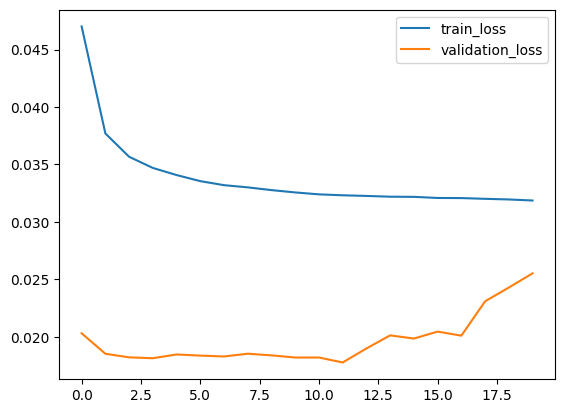

In [11]:

loss_df = pd.DataFrame(loss_log,columns=['epoch', 'train_loss', 'validation_loss'])
loss_df[['train_loss', 'validation_loss']].plot()

In [12]:
loss_df.to_csv('bldblock_NN_epoch_1-20.csv',index=False)

Model Parameters = 23613441

num of train_file:  5
num of validation_file:  1
batch_size=100000000: 24.4 s
batch size 10000000: 24.7 s
batch size 1000000: 24.6 s
batch_size=100000: 23.4 s
batch size 1024: 37.5 s

num of train_file:  20
num of validation_file:  4
batch_size=100000000: 1min 37s
batch size 10000000: 1min 42s
batch size 1024: 4min 2s

## Validation test on different protein

In [ ]:
import numpy as np
import os, random, time
import pandas as pd
from pathlib import Path
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, average_precision_score

def get_files(input_list):
    out_list=[]
    if type(input_list)==type(None):
        return out_list
    for item in input_list:
        
        if os.path.isdir(item):
            out_list.extend(list(Path(item).rglob("*.npz")))

        elif item[-4:]=='.npz':
            out_list.append(item)        
    
    random.seed(0)
    random.shuffle(out_list)
    return out_list

def read_from_file(file_name):
    data=np.load(file_name)
    return data['morgan1'],data['morgan2'],data['morgan3'], data['protein'], data['labels']

def generate_batches(files, batch_size=1024):
    counter = 0
    
    print_freq=max(1, len(files)//10)
    
    while counter<len(files):
        file_name = files[counter]

        counter +=1
        
        data=read_from_file(file_name)

        morgan1, morgan2, morgan3, protein, labels=data
        batch_size=max(batch_size,1)
        for local_index in range(0, labels.shape[0], batch_size):
            batch_morgan1=morgan1[local_index:(local_index + batch_size)]
            batch_morgan2=morgan2[local_index:(local_index + batch_size)]
            batch_morgan3=morgan3[local_index:(local_index + batch_size)]
            batch_protein=protein[local_index:(local_index + batch_size)]
            batch_labels=labels[local_index:(local_index + batch_size)]          

            yield batch_morgan1, batch_morgan2, batch_morgan3, batch_protein, batch_labels
        
        if counter%print_freq==0:
            print('.', end='',flush=True)


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

from torch import optim, Tensor

from torch.nn.parallel import DataParallel

class Net(nn.Module):

    def __init__(self):
        super(Net, self).__init__()
        self.fc1=nn.Linear(3075,2048)
        self.dropout1 = nn.Dropout(0.2)
        self.fc2=nn.Linear(2048,1024)
        self.dropout3 = nn.Dropout(0.2)
        self.fc4=nn.Linear(1024,512)
        self.fc5=nn.Linear(512,128)
        self.out=nn.Linear(128,1)
        
    def forward(self, x):
        x=F.relu(self.fc1(x))
        x=F.relu(self.fc2(x))
        x=F.relu(self.fc4(x))
        x=F.relu(self.fc5(x))
        out=self.out(x)
        return out

In [7]:
model_load_path = "/mnt/isilon/wang_lab/shared/Belka/analysis/saved_models/bldblock_NN_epoch_8.pth"
checkpoint = torch.load(model_load_path)

# load the model and continue training
dev = 'cuda' if torch.cuda.is_available() else 'cpu'
net = Net().to(dev)
net = DataParallel(net) #do this because previous model is within DataParallel
net.load_state_dict(checkpoint['model_state_dict'])


optimizer = optim.Adam(net.parameters(), lr=0.001)
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
#loss = loss.load_state_dict(checkpoint['loss'])

In [22]:
test_files=get_files(['morgan_validation_complete/'])
print('num of validation_file: ',len(test_files))

num of validation_file:  119


In [23]:
%%time
with torch.no_grad():
    net.eval()
    preds = []
    labels = []
    proteins = []
    test_loss = 0
    test_generator = generate_batches(test_files, batch_size=50000)
    for batch in test_generator:
        batch_morgan1, batch_morgan2, batch_morgan3, batch_protein, batch_labels = batch
        batch_morgan = np.concatenate((batch_morgan1, batch_morgan2, batch_morgan3, batch_protein), 1)
        score = net(torch.Tensor(batch_morgan).to(dev))
        #loss = torch.nn.functional.binary_cross_entropy_with_logits(score, torch.Tensor(batch_labels)[:, None].to(dev), pos_weight=pos_weight_vali)
        
        preds.append(torch.sigmoid(score).cpu().numpy())
        labels.append(batch_labels)
        proteins.append(batch_protein)
        #test_loss += loss.cpu().item() * len(score)

    preds = np.vstack(preds)[:, 0]
    labels = np.hstack(labels)
    proteins = np.vstack(proteins)

    # Calculate additional metrics
    ap = average_precision_score(labels, preds)
    roc_auc = roc_auc_score(labels, preds)

    print(f'Test AP={ap:.6f} ROC_AUC={roc_auc:.6f}')



..........Test AP=0.639679 ROC_AUC=0.986233
CPU times: user 5min 37s, sys: 3min 29s, total: 9min 6s
Wall time: 12min 6s


In [30]:
preds

array([4.2627672e-08, 9.7955370e-01, 9.9566805e-01, ..., 1.4888950e-07,
       3.0479138e-04, 8.3507366e-06], dtype=float32)

In [26]:
labels

array([0, 1, 1, ..., 0, 0, 0], dtype=int8)

In [27]:
proteins

array([[1, 0, 0],
       [0, 1, 0],
       [0, 0, 1],
       ...,
       [0, 0, 1],
       [1, 0, 0],
       [0, 0, 1]], dtype=int8)

In [28]:
np.savez('bldblock_NN_epoch_8_validation_save.npz', 
         preds=preds,labels=labels,proteins=proteins)

In [40]:
p_map = {'BRD4': 0, 'HSA': 1, 'sEH': 2}
protein_names = ['BRD4', 'HSA', 'sEH']

In [47]:
np.sum(proteins,axis=0)

array([19681160, 19678117, 19685434])

In [42]:
import numpy as np
from sklearn.metrics import average_precision_score, precision_recall_curve
import matplotlib.pyplot as plt

In [53]:
p_filter = proteins[:,0] == 1
len(labels[p_filter])

19681160

Average Precision for BRD4: 0.5306
Average Precision for HSA: 0.3901
Average Precision for sEH: 0.8234


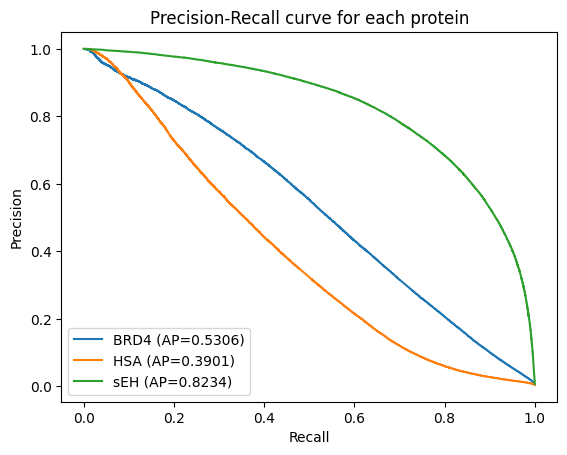

In [44]:
# Plot precision-recall curves for each protein in one plot
plt.figure()

for protein_name, protein_idx in p_map.items():
    # Filter data for the current protein
    protein_filter = proteins[:, protein_idx] == 1
    protein_preds = preds[protein_filter]
    protein_labels = labels[protein_filter]

    # Calculate average precision
    ap = average_precision_score(protein_labels, protein_preds)
    print(f'Average Precision for {protein_name}: {ap:.4f}')

    # Calculate precision-recall curve
    precision, recall, _ = precision_recall_curve(protein_labels, protein_preds)

    # Plot precision-recall curve
    plt.plot(recall, precision, label=f'{protein_name} (AP={ap:.4f})')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall curve for each protein (bdb_NN_epoch8)')
plt.legend()
plt.show()

### model using both bb and complete molecule

## test on the real competition test data

In [34]:
def get_files(input_list):
    out_list=[]
    if type(input_list)==type(None):
        return out_list
    for item in input_list:
        
        if os.path.isdir(item):
            out_list.extend(list(Path(item).rglob("*.npz")))

        elif item[-4:]=='.npz':
            out_list.append(item)        
    
    random.seed(0)
    random.shuffle(out_list)
    return out_list

def read_from_file(file_name):
    data=np.load(file_name)
    return data['morgan1'],data['morgan2'],data['morgan3'], data['protein'], data['labels']

def read_from_test_file(file_name):
    data=np.load(file_name)
    return data['morgan1'],data['morgan2'],data['morgan3'], data['protein'], data['ids']

def generate_batches(files, batch_size=1024):
    counter = 0
    
    print_freq=max(1, len(files)//10)
    
    while counter<len(files):
        file_name = files[counter]

        counter +=1
        
        data=read_from_file(file_name)

        morgan1, morgan2, morgan3, protein, labels=data
        batch_size=max(batch_size,1)
        for local_index in range(0, labels.shape[0], batch_size):
            batch_morgan1=morgan1[local_index:(local_index + batch_size)]
            batch_morgan2=morgan2[local_index:(local_index + batch_size)]
            batch_morgan3=morgan3[local_index:(local_index + batch_size)]
            batch_protein=protein[local_index:(local_index + batch_size)]
            batch_labels=labels[local_index:(local_index + batch_size)]          

            yield batch_morgan1, batch_morgan2, batch_morgan3, batch_protein, batch_labels
        
        if counter%print_freq==0:
            print('.', end='',flush=True)

def generate_test_batches(files, batch_size=1024):
    counter = 0
    
    print_freq=max(1, len(files)//10)
    
    while counter<len(files):
        file_name = files[counter]

        counter +=1
        
        data=read_from_test_file(file_name)

        morgan1, morgan2, morgan3, protein, ids=data
        batch_size=max(batch_size,1)
        for local_index in range(0, ids.shape[0], batch_size):
            batch_morgan1=morgan1[local_index:(local_index + batch_size)]
            batch_morgan2=morgan2[local_index:(local_index + batch_size)]
            batch_morgan3=morgan3[local_index:(local_index + batch_size)]
            batch_protein=protein[local_index:(local_index + batch_size)]
            batch_ids=ids[local_index:(local_index + batch_size)]   

            yield batch_morgan1, batch_morgan2, batch_morgan3, batch_protein, batch_ids
        
        if counter%print_freq==0:
            print('.', end='',flush=True)

            
            
class Net(nn.Module):

    def __init__(self):
        super(Net, self).__init__()
        self.fc1=nn.Linear(3075,4096)
        #self.dropout1 = nn.Dropout(0.2)
        self.fc2=nn.Linear(4096,2048)
        #self.dropout3 = nn.Dropout(0.2)
        self.fc4=nn.Linear(2048,1024)
        self.fc5=nn.Linear(1024,256)
        self.out=nn.Linear(256,1)
        
    def forward(self, x):
        x=F.relu(self.fc1(x))
        x=F.relu(self.fc2(x))
        x=F.relu(self.fc4(x))
        x=F.relu(self.fc5(x))
        out=self.out(x)
        return out
   

In [29]:
class Net(nn.Module):

    def __init__(self):
        super(Net, self).__init__()
        self.fc1=nn.Linear(3075,4096)
        self.dropout1 = nn.Dropout(0.2)
        self.fc2=nn.Linear(4096,2048)
        self.dropout3 = nn.Dropout(0.2)
        self.fc4=nn.Linear(2048,1024)
        self.fc5=nn.Linear(1024,256)
        self.out=nn.Linear(256,1)
        
    def forward(self, x):
        x=F.relu(self.fc1(x))
        x=F.relu(self.fc2(x))
        x=F.relu(self.fc4(x))
        x=F.relu(self.fc5(x))
        out=self.out(x)
        return out

    

In [35]:
model_load_path = "/mnt/isilon/wang_lab/shared/Belka/analysis/saved_models/NN_20M_199pw_0620_epoch16.pth"
checkpoint = torch.load(model_load_path)

# load the model and continue training
dev = 'cuda' if torch.cuda.is_available() else 'cpu'
net = Net().to(dev)
net = DataParallel(net) #do this because previous model is within DataParallel
net.load_state_dict(checkpoint['model_state_dict'])


optimizer = optim.Adam(net.parameters(), lr=0.001)
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
#loss = loss.load_state_dict(checkpoint['loss'])

In [36]:
test_files=get_files(['morgan_test_complete/'])

In [37]:
test_files

[PosixPath('morgan_test_complete/data_test1.npz'),
 PosixPath('morgan_test_complete/data_test2.npz'),
 PosixPath('morgan_test_complete/data_test0.npz'),
 PosixPath('morgan_test_complete/data_test3.npz')]

In [38]:
with torch.no_grad():
    net.eval()
    preds = []
    ids = []
    
    
    test_generator = generate_test_batches(test_files, batch_size=50000)
    for batch in test_generator:
        batch_morgan1, batch_morgan2, batch_morgan3, batch_protein, batch_ids = batch
        batch_morgan = np.concatenate((batch_morgan1, batch_morgan2, batch_morgan3, batch_protein), 1)
        score = net(torch.Tensor(batch_morgan).to(dev))
        preds.append(torch.sigmoid(score).cpu().numpy())
        ids.append(batch_ids)

    preds = np.vstack(preds)[:, 0]
    ids = np.vstack(ids)[:,0]
    print("\n prediction on text dataset finished.")

df = pd.DataFrame({
    'id': ids,
    'preds': preds
})

....
 prediction on text dataset finished.


In [39]:
df.to_csv('/mnt/isilon/wang_lab/shared/Belka/analysis/NN_20M_199pw_0620_epoch16_submission.csv',index=None)

In [21]:
with torch.no_grad():
    net.eval()
    preds = []
    ids = []
    
    
    test_generator = generate_test_batches(test_files, batch_size=500000)
    for batch in test_generator:
        batch_morgan1, batch_morgan2, batch_morgan3, batch_protein, batch_ids = batch
        batch_morgan = np.concatenate((batch_morgan1, batch_morgan2, batch_morgan3, batch_protein), 1)
        score = net(torch.Tensor(batch_morgan).to(dev))
        preds.append(torch.sigmoid(score).cpu().numpy())
        ids.append(batch_ids)

    preds = np.vstack(preds)[:, 0]
    ids = np.vstack(ids)[:,0]
    print("\n prediction on text dataset finished.")

df = pd.DataFrame({
    'id': ids,
    'preds': preds
})

ValueError: too many values to unpack (expected 5)

In [23]:
df.to_csv('/mnt/isilon/wang_lab/shared/Belka/analysis/bldblock_NN_epoch_17_submission.csv',index=None)

In [47]:
#this is the original trainning part, keep it for reference

%%time
pos_weight=torch.Tensor(np.array(5.0))
epoch_num=10

for i in range(epoch_num):
    net.train()
    train_loss=0
    train_generator=generate_batches(train_files, batch_size=1024)
    for batch in train_generator:
        optimizer.zero_grad()
        batch_morgan, batch_protein, batch_labels=batch
        batch_morgan=np.concatenate((batch_morgan, batch_protein),1) #combine morgan fp with protein onehot encoding
        score=net(torch.Tensor(batch_morgan).to(dev))
        loss =  torch.nn.functional.binary_cross_entropy_with_logits(score, torch.Tensor(batch_labels)[:,None].to(dev), pos_weight=pos_weight)
        train_loss+=loss.cpu().item()*len(score)
        loss.backward()
        optimizer.step()
    
    
    with torch.no_grad():
        net.eval()
        preds=[]
        labels=[]
        test_loss=0
        test_generator=generate_batches(test_files, batch_size=1024)
        for batch in test_generator:
            batch_morgan, batch_protein, batch_labels=batch
            batch_morgan=np.concatenate((batch_morgan, batch_protein),1)
            score=net(torch.Tensor(batch_morgan).to(dev))
            loss =  torch.nn.functional.binary_cross_entropy_with_logits(score, torch.Tensor(batch_labels)[:,None].to(dev), pos_weight=pos_weight)
            preds.append(torch.nn.functional.sigmoid(score))
            labels.append(batch_labels)
            test_loss+=loss.cpu().item()*len(score)
            
        preds=torch.vstack(preds).cpu().numpy()[:,0]
        labels=np.hstack(labels)
        ap=average_precision_score(labels, preds)
        print('\n Epoch={} Train_Loss={} Test_Loss={} Test AP={}'.format(i+1, train_loss/len(labels), test_loss/len(labels), ap))

...............
 Epoch=1 Train_Loss=1.003138149199302 Test_Loss=0.04882204769590944 Test AP=0.13260512288866608
...............
 Epoch=2 Train_Loss=0.8343921044622662 Test_Loss=0.052541076241587104 Test AP=0.15806395912532023
...............
 Epoch=3 Train_Loss=0.7964697278223664 Test_Loss=0.06023136017497704 Test AP=0.16564010288688769
...............
 Epoch=4 Train_Loss=0.7719787498841771 Test_Loss=0.06954713337385077 Test AP=0.16598595814173905
...............
 Epoch=5 Train_Loss=0.7594206354114563 Test_Loss=0.11244394741869336 Test AP=0.17529272770581467
...............
 Epoch=6 Train_Loss=0.7488237145274264 Test_Loss=0.156620718493725 Test AP=0.1808955108795634
...............
 Epoch=7 Train_Loss=0.7353306274759498 Test_Loss=0.32474393346613667 Test AP=0.17521899748532252
...............
 Epoch=8 Train_Loss=0.7311725073708566 Test_Loss=0.4824021732787721 Test AP=0.18973572540806538
...............
 Epoch=9 Train_Loss=0.7230835853912253 Test_Loss=0.5686870524970539 Test AP=0.196638